In [3]:
from pathlib import Path
from PIL import Image
from ultralytics import YOLO
import pandas as pd

PROJECT_PATH = Path("..")
DATASET_PATH = PROJECT_PATH / "02_datasets" / "DUT_Anti_UAV"
TEST_IMAGES = DATASET_PATH / "images" / "test"
TEST_LABELS = DATASET_PATH / "labels" / "test"
MODEL_PATH = (
    PROJECT_PATH
    / "runs"
    / "detect"
    / "04_experiments"
    / "EXP001_YOLOv8s_baseline"
    / "weights"
    / "best.pt"
)

model = YOLO(MODEL_PATH)

# Build Ground Truth boxes in pixel coordinates.
gt_records = []

for label_file in sorted(TEST_LABELS.glob("*.txt")):
    image_name = label_file.stem
    image_path = TEST_IMAGES / f"{image_name}.jpg"

    with Image.open(image_path) as image:
        image_width, image_height = image.size

    for gt_id, line in enumerate(label_file.read_text().splitlines()):
        values = line.split()
        if len(values) < 5:
            continue

        class_id, x_center, y_center, width, height = map(float, values[:5])
        gt_records.append({
            "image": image_name,
            "gt_id": gt_id,
            "class": int(class_id),
            "x1": (x_center - width / 2) * image_width,
            "y1": (y_center - height / 2) * image_height,
            "x2": (x_center + width / 2) * image_width,
            "y2": (y_center + height / 2) * image_height,
        })

gt_clean = pd.DataFrame(gt_records)

# Build prediction boxes in pixel coordinates.
pred_records = []

for image_path in sorted(TEST_IMAGES.glob("*.jpg")):
    result = model.predict(
        source=str(image_path),
        conf=0.25,
        verbose=False,
        device=0,
    )[0]

    for pred_id, box in enumerate(result.boxes):
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        pred_records.append({
            "image": image_path.stem,
            "pred_id": pred_id,
            "class": int(box.cls[0].item()),
            "confidence": float(box.conf[0].item()),
            "x1": float(x1),
            "y1": float(y1),
            "x2": float(x2),
            "y2": float(y2),
        })

pred_clean = pd.DataFrame(pred_records)

print("Ground Truth boxes:", len(gt_clean))
print("Prediction boxes:", len(pred_clean))

Ground Truth boxes: 2245
Prediction boxes: 2263


In [5]:
import pandas as pd
import numpy as np


# --------------------------------------------------
# IoU function
# --------------------------------------------------

def calculate_iou(box1, box2):

    x1 = max(box1["x1"], box2["x1"])
    y1 = max(box1["y1"], box2["y1"])
    x2 = min(box1["x2"], box2["x2"])
    y2 = min(box1["y2"], box2["y2"])

    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)

    intersection = inter_w * inter_h

    area1 = (
        (box1["x2"] - box1["x1"]) *
        (box1["y2"] - box1["y1"])
    )

    area2 = (
        (box2["x2"] - box2["x1"]) *
        (box2["y2"] - box2["y1"])
    )

    union = area1 + area2 - intersection

    if union == 0:
        return 0

    return intersection / union

In [6]:
IOU_THRESHOLD = 0.5

match_records = []


for image_name in pred_clean["image"].unique():

    preds = pred_clean[
        pred_clean["image"] == image_name
    ].copy()

    gts = gt_clean[
        gt_clean["image"] == image_name
    ].copy()


    # Highest-confidence predictions first
    preds = preds.sort_values(
        "confidence",
        ascending=False
    )


    matched_gt = set()


    for pred_index, pred in preds.iterrows():

        best_iou = 0
        best_gt_index = None


        for gt_index, gt in gts.iterrows():

            # GT already assigned to another prediction
            if gt_index in matched_gt:
                continue


            iou = calculate_iou(pred, gt)


            if iou > best_iou:

                best_iou = iou
                best_gt_index = gt_index


        # ------------------------------------------
        # TP
        # ------------------------------------------

        if best_iou >= IOU_THRESHOLD:

            status = "TP"

            matched_gt.add(best_gt_index)


        # ------------------------------------------
        # FP
        # ------------------------------------------

        else:

            status = "FP"


        match_records.append({

            "image": image_name,

            "pred_id": pred["pred_id"],

            "confidence": pred["confidence"],

            "x1": pred["x1"],
            "y1": pred["y1"],
            "x2": pred["x2"],
            "y2": pred["y2"],

            "best_iou": best_iou,

            "status": status

        })


matches_df = pd.DataFrame(match_records)

print("Matched predictions:", len(matches_df))
print(matches_df["status"].value_counts())

Matched predictions: 2263
status
TP    2104
FP     159
Name: count, dtype: int64


In [7]:
fp_df = matches_df[matches_df["status"] == "FP"].copy()

print("False Positives:", len(fp_df))
fp_df.head()

False Positives: 159


,image,pred_id,confidence,x1,y1,x2,y2,best_iou,status
10,00010,1,0.470773,884.883911,433.264984,912.598999,448.068756,0.000000,FP
54,00055,0,0.659128,202.600174,390.699280,339.329407,445.822937,0.204890,FP
70,00071,0,0.250816,592.266357,290.510681,683.909912,315.937195,0.146954,FP
110,00110,1,0.324773,754.394104,246.948547,838.321716,296.697815,0.000000,FP
141,00127,3,0.377687,932.605835,200.720627,1047.195557,335.855652,0.000000,FP


In [9]:
fp_df = matches_df[matches_df["status"] == "FP"].copy()

top_fp = fp_df.sort_values(
    "confidence",
    ascending=False
).head(20)

top_fp

,image,pred_id,confidence,x1,y1,x2,y2,best_iou,status
340,00317,0,0.891422,629.394958,517.845703,893.402771,633.588867,0.000000,FP
1234,01187,0,0.890132,512.810181,266.914276,752.489868,370.697296,0.470858,FP
1302,01243,0,0.879506,564.144287,217.090454,822.244873,342.306152,0.456634,FP
1407,01345,1,0.858418,721.013062,297.573730,983.451050,418.606995,0.000000,FP
1273,01224,0,0.855506,176.030930,118.429993,490.690613,332.318726,0.463408,FP
1244,01197,0,0.834298,503.030823,226.027145,541.784851,245.270691,0.000000,FP
1267,01219,0,0.828034,710.119019,124.762115,1186.246948,323.373169,0.389726,FP
227,00210,1,0.820578,87.918594,349.369202,122.855194,367.184265,0.000000,FP
1277,01226,0,0.811765,412.568115,175.575867,850.453735,563.186646,0.318617,FP
2143,02077,0,0.808891,322.429504,708.003113,383.725616,733.020996,0.000000,FP


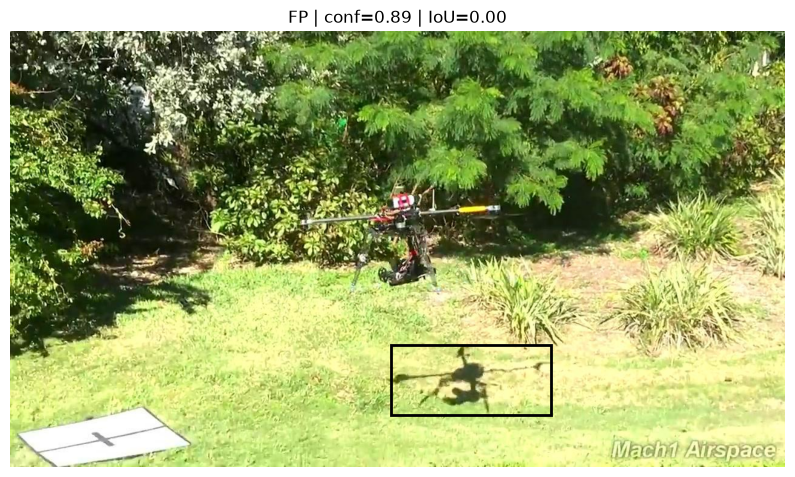

In [11]:
import matplotlib.pyplot as plt
import cv2

row = top_fp.iloc[0]

img_path = TEST_IMAGES / f"{row.image}.jpg"

img = cv2.imread(str(img_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,7))
plt.imshow(img)

plt.gca().add_patch(
    plt.Rectangle(
        (row.x1,row.y1),
        row.x2-row.x1,
        row.y2-row.y1,
        fill=False,
        linewidth=2
    )
)

plt.title(
    f"FP | conf={row.confidence:.2f} | IoU={row.best_iou:.2f}"
)

plt.axis("off")
plt.show()

NameError: name 'LABELS' is not defined

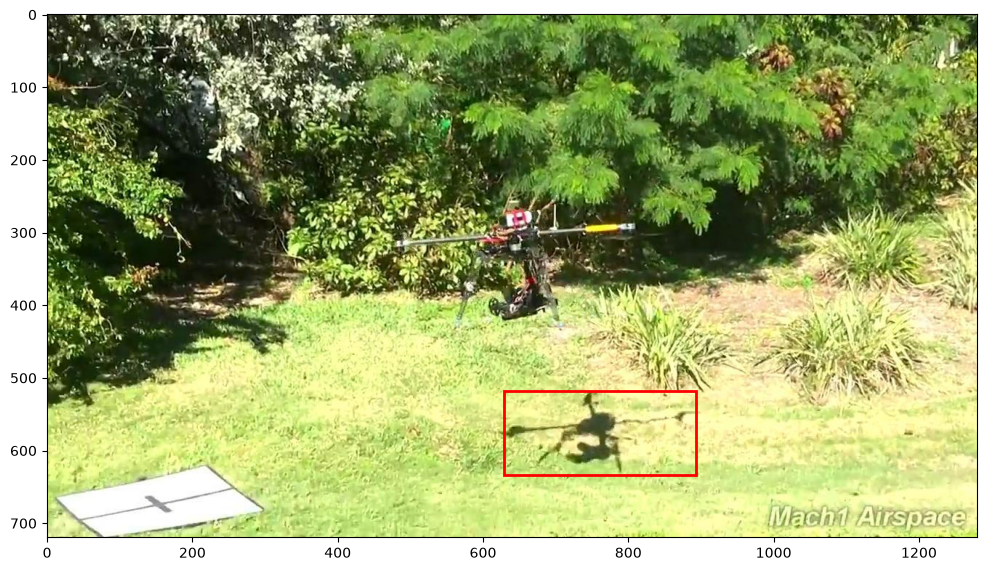

In [12]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
from pathlib import Path


row = top_fp.iloc[0]

# صورة الاختبار
img_path = TEST_IMAGES / f"{row.image}.jpg"

img = cv2.imread(str(img_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


plt.figure(figsize=(12,8))
plt.imshow(img)


ax = plt.gca()


# =========================
# Prediction Box (RED)
# =========================

pred_box = patches.Rectangle(
    (row.x1, row.y1),
    row.x2-row.x1,
    row.y2-row.y1,
    linewidth=2,
    edgecolor="red",
    facecolor="none",
    label="Prediction"
)

ax.add_patch(pred_box)



# =========================
# Ground Truth Boxes (GREEN)
# =========================

# نجيب الـ labels الخاصة بالصورة
label_path = LABELS / f"{row.image}.txt"


if label_path.exists():

    with open(label_path,"r") as f:
        labels = f.readlines()


    h,w,_ = img.shape


    for line in labels:

        cls, xc, yc, bw, bh = map(float,line.split())


        # YOLO format --> pixel
        xc *= w
        yc *= h
        bw *= w
        bh *= h


        x1 = xc - bw/2
        y1 = yc - bh/2


        gt_box = patches.Rectangle(
            (x1,y1),
            bw,
            bh,
            linewidth=2,
            edgecolor="green",
            facecolor="none"
        )

        ax.add_patch(gt_box)



plt.title(
    f"{row.image} | FP | conf={row.confidence:.2f} | IoU={row.best_iou:.2f}"
)


plt.axis("off")
plt.show()

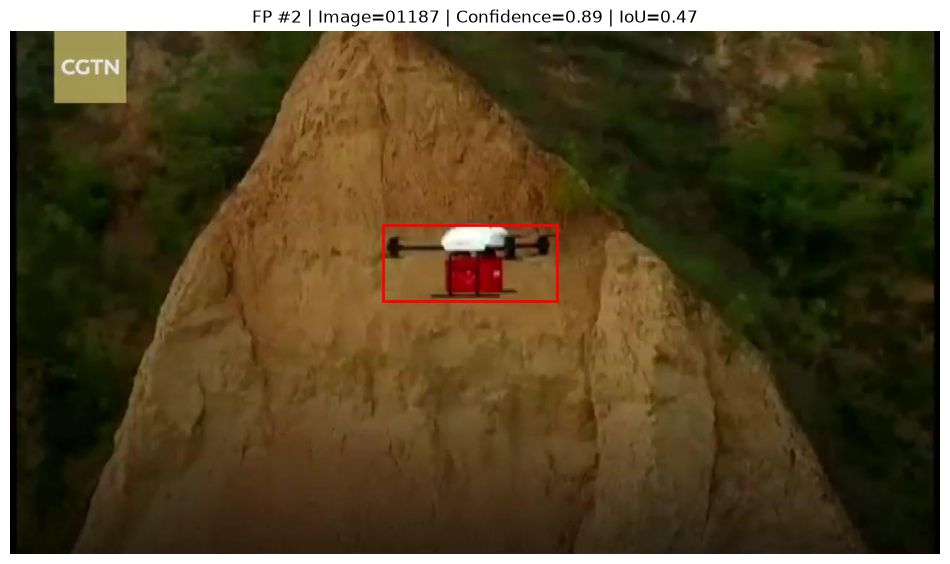

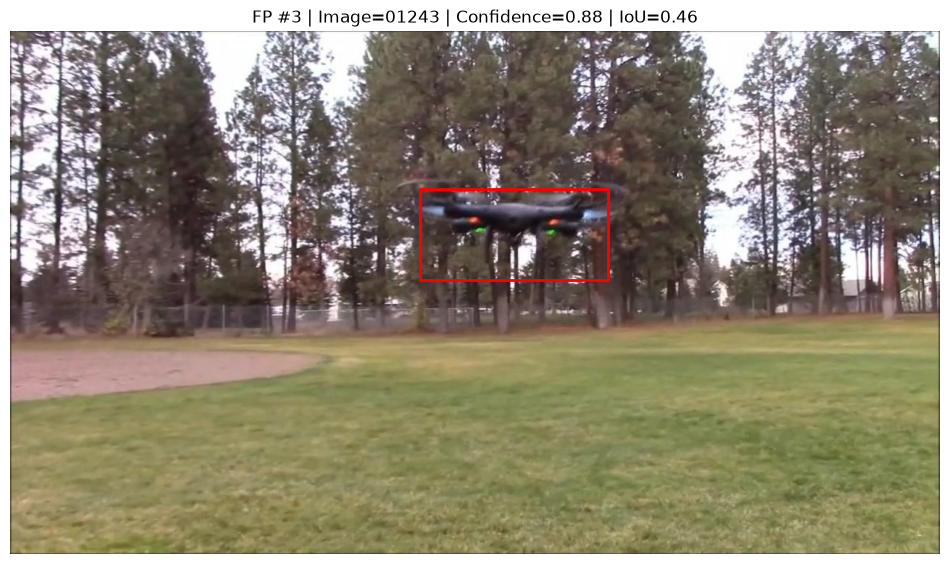

In [13]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2


# عرض FP رقم 2 و 3
for i in [1, 2]:

    row = top_fp.iloc[i]

    img_path = TEST_IMAGES / f"{row.image}.jpg"

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12,8))
    plt.imshow(img)

    ax = plt.gca()

    # Prediction box (Red)
    rect = patches.Rectangle(
        (row.x1, row.y1),
        row.x2 - row.x1,
        row.y2 - row.y1,
        linewidth=2,
        edgecolor="red",
        facecolor="none"
    )

    ax.add_patch(rect)

    plt.title(
        f"FP #{i+1} | Image={row.image} | "
        f"Confidence={row.confidence:.2f} | "
        f"IoU={row.best_iou:.2f}"
    )

    plt.axis("off")
    plt.show()

In [15]:
# Copy FP dataframe
fp_analysis = top_fp.copy()


# حالات لا يوجد لها أي تطابق مع Ground Truth
background_fp = fp_analysis[
    fp_analysis.best_iou == 0
]


# حالات قريبة من Drone حقيقي
localization_fp = fp_analysis[
    (fp_analysis.best_iou > 0) &
    (fp_analysis.best_iou < 0.5)
]


print("Total FP:", len(fp_analysis))

print(
    "Background False Positive:",
    len(background_fp)
)

print(
    "Localization Error:",
    len(localization_fp)
)

Total FP: 20
Background False Positive: 9
Localization Error: 11


In [16]:
total_fp = len(fp_analysis)

background_percentage = (
    len(background_fp) / total_fp
) * 100


localization_percentage = (
    len(localization_fp) / total_fp
) * 100


print(
    f"Background FP: {background_percentage:.2f}%"
)

print(
    f"Localization Error: {localization_percentage:.2f}%"
)


Background FP: 45.00%
Localization Error: 55.00%


In [17]:
fp_analysis[
    [
        "image",
        "confidence",
        "best_iou"
    ]
].head(20)

,image,confidence,best_iou
340,00317,0.891422,0.000000
1234,01187,0.890132,0.470858
1302,01243,0.879506,0.456634
1407,01345,0.858418,0.000000
1273,01224,0.855506,0.463408
1244,01197,0.834298,0.000000
1267,01219,0.828034,0.389726
227,00210,0.820578,0.000000
1277,01226,0.811765,0.318617
2143,02077,0.808891,0.000000


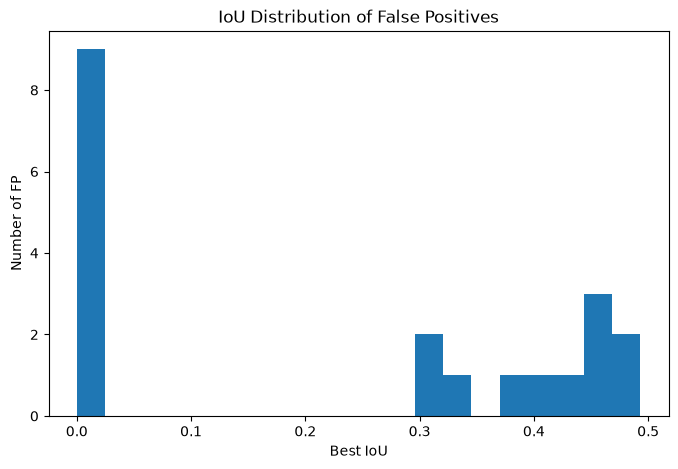

In [18]:
import matplotlib.pyplot as plt


plt.figure(figsize=(8,5))

plt.hist(
    fp_analysis["best_iou"],
    bins=20
)

plt.xlabel("Best IoU")
plt.ylabel("Number of FP")

plt.title(
    "IoU Distribution of False Positives"
)

plt.show()

In [19]:
background_fp[["image","confidence","best_iou"]].head(20)

,image,confidence,best_iou
340,00317,0.891422,0.0
1407,01345,0.858418,0.0
1244,01197,0.834298,0.0
227,00210,0.820578,0.0
2143,02077,0.808891,0.0
1109,01079,0.785229,0.0
1215,01167,0.754896,0.0
1354,01296,0.749118,0.0
155,00138,0.744798,0.0


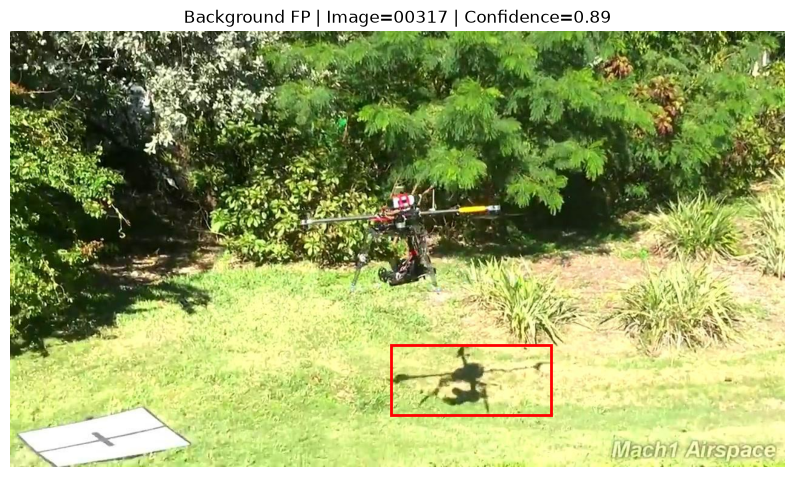

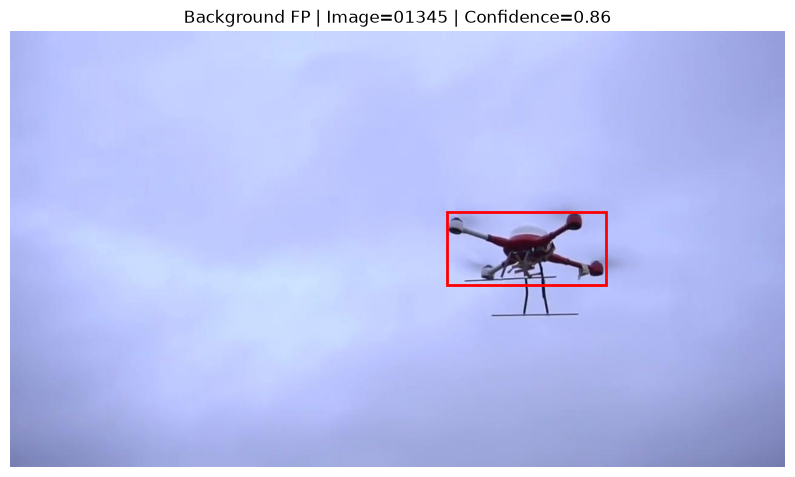

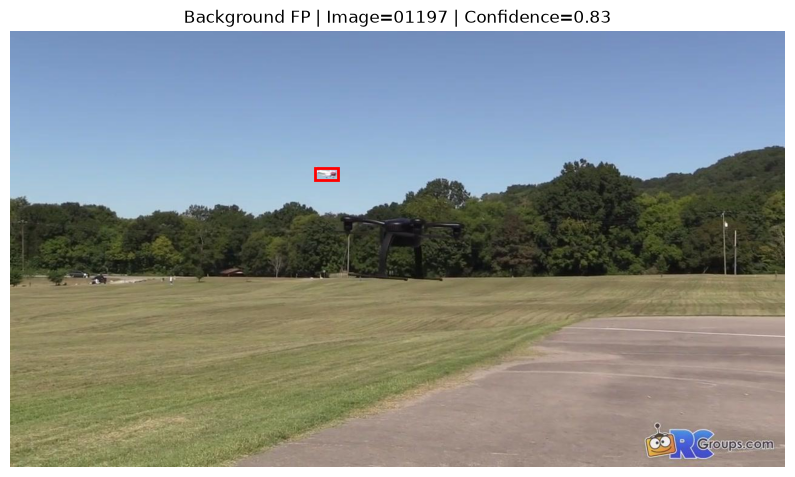

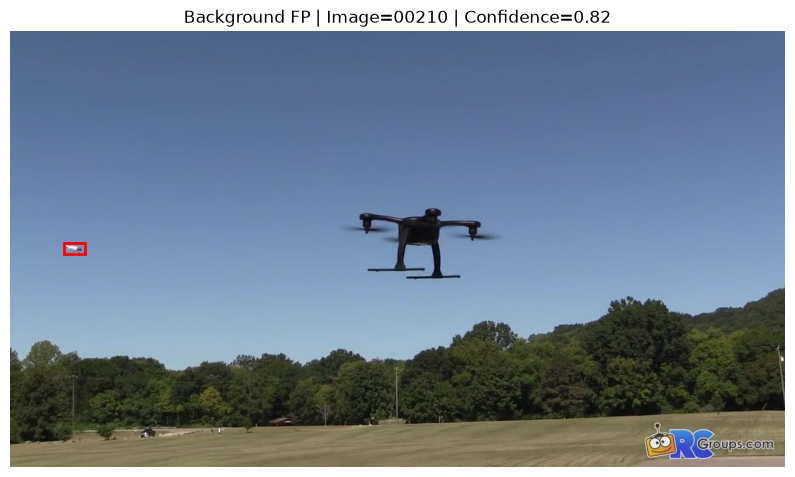

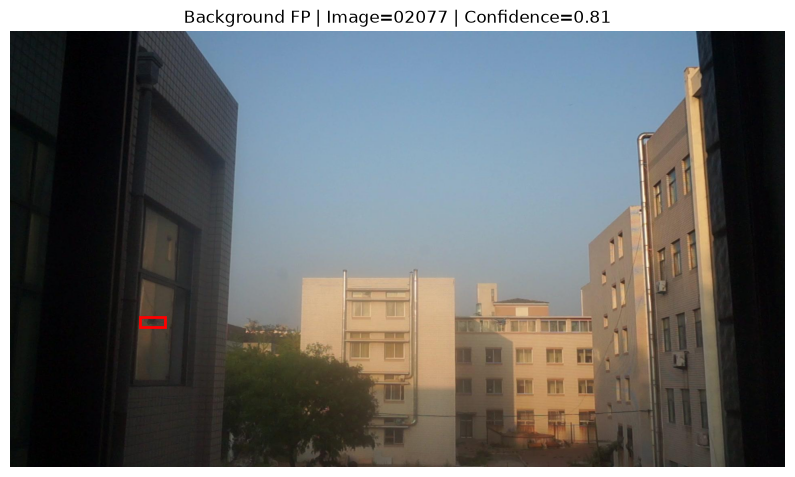

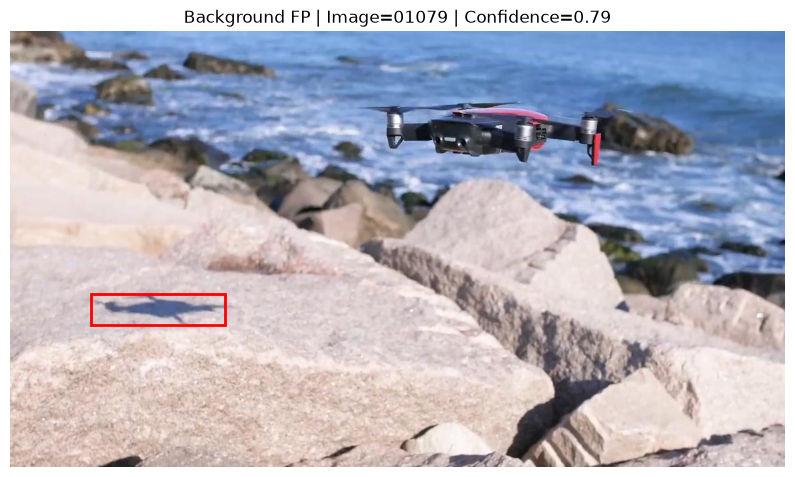

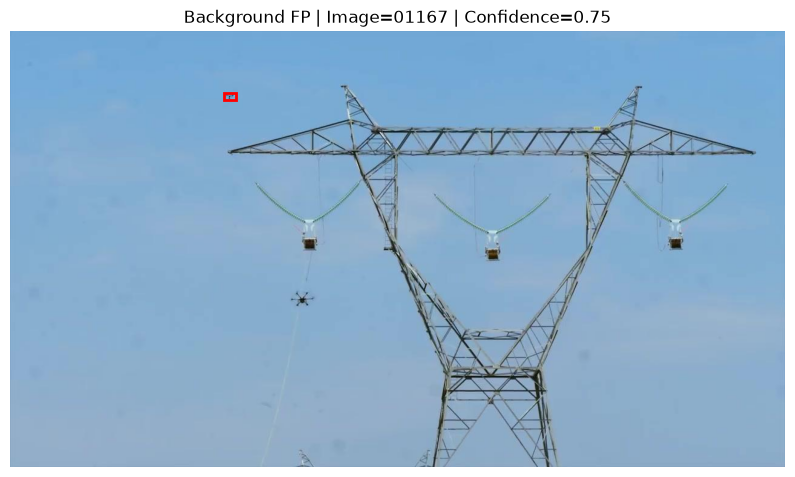

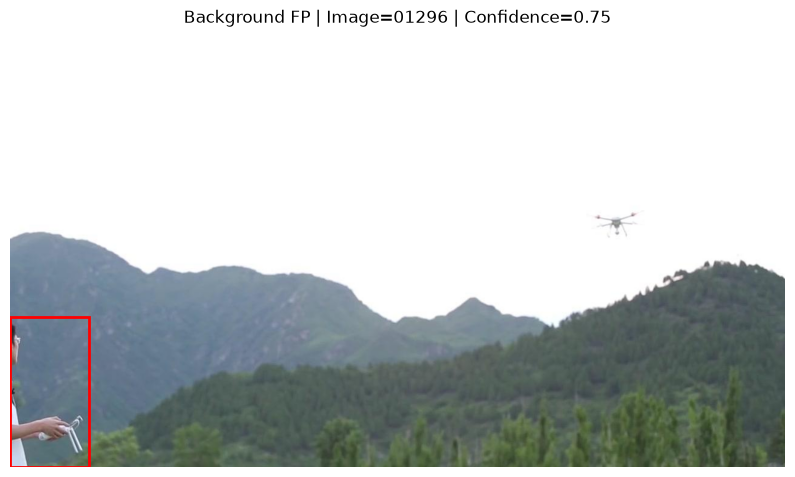

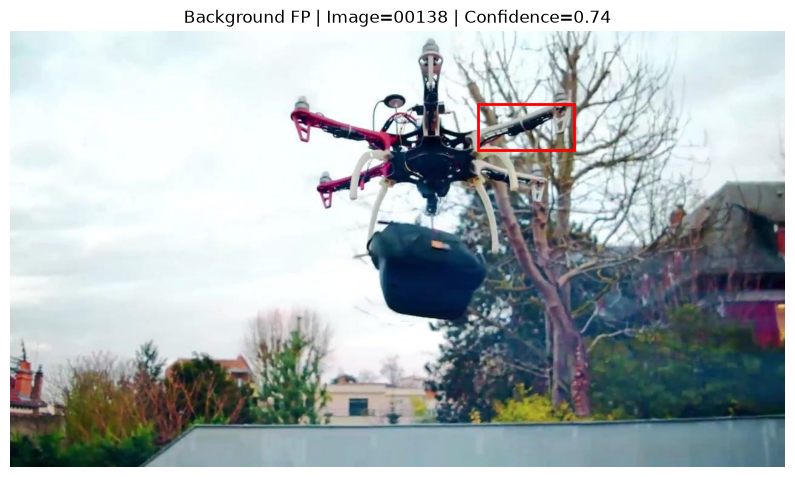

In [20]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2


for idx, row in background_fp.iterrows():

    img_path = TEST_IMAGES / f"{row.image}.jpg"

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


    plt.figure(figsize=(10,7))

    plt.imshow(img)

    ax = plt.gca()


    # Prediction box
    rect = patches.Rectangle(
        (row.x1, row.y1),
        row.x2-row.x1,
        row.y2-row.y1,
        linewidth=2,
        edgecolor="red",
        facecolor="none"
    )

    ax.add_patch(rect)


    plt.title(
        f"Background FP | Image={row.image} | "
        f"Confidence={row.confidence:.2f}"
    )


    plt.axis("off")
    plt.show()

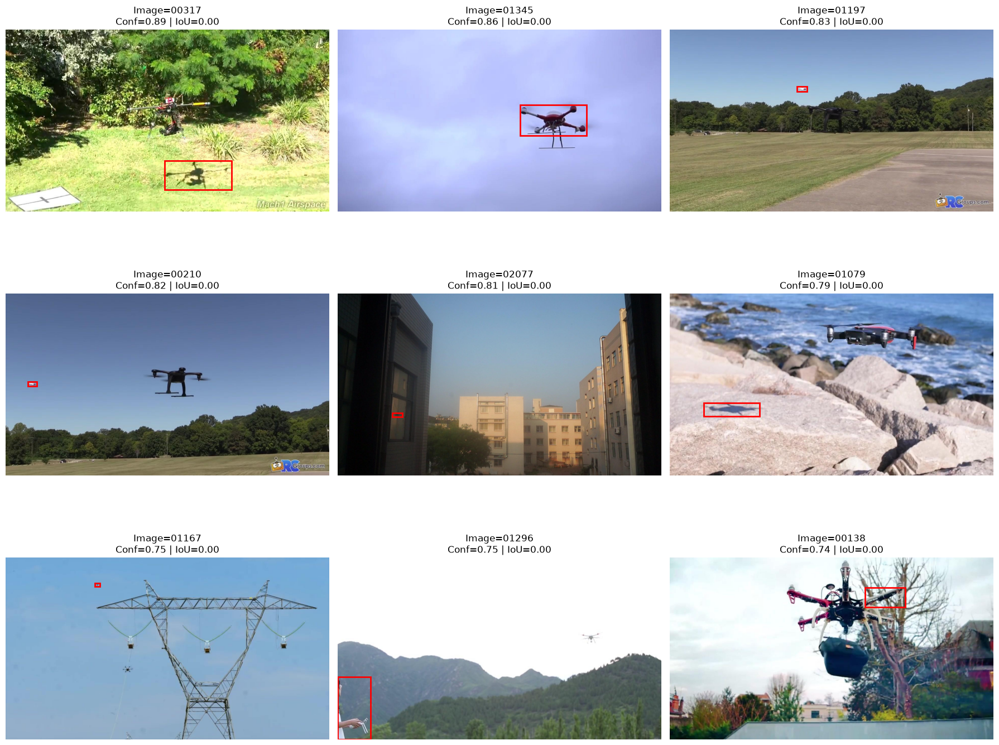

In [21]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import math

# عدد الصور في كل صف
cols = 3

n = len(background_fp)
rows = math.ceil(n / cols)

plt.figure(figsize=(18, 5 * rows))

for plot_idx, (_, row) in enumerate(background_fp.iterrows(), start=1):

    img_path = TEST_IMAGES / f"{row.image}.jpg"

    img = cv2.imread(str(img_path))

    if img is None:
        print(f"Could not read: {img_path}")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ax = plt.subplot(rows, cols, plot_idx)

    ax.imshow(img)

    # Prediction box
    rect = patches.Rectangle(
        (row.x1, row.y1),
        row.x2 - row.x1,
        row.y2 - row.y1,
        linewidth=2,
        edgecolor="red",
        facecolor="none"
    )

    ax.add_patch(rect)

    ax.set_title(
        f"Image={row.image}\n"
        f"Conf={row.confidence:.2f} | IoU={row.best_iou:.2f}"
    )

    ax.axis("off")


plt.tight_layout()
plt.show()

In [22]:
background_fp = background_fp.copy()

background_fp["error_type"] = ""
background_fp["note"] = ""

In [23]:
background_fp.loc[
    background_fp["image"] == "00317",
    ["error_type", "note"]
] = [
    "Shadow confusion",
    "Drone shadow detected instead of UAV"
]

background_fp.loc[
    background_fp["image"] == "00138",
    ["error_type", "note"]
] = [
    "Shadow confusion",
    "Drone shadow detected instead of UAV"
]

background_fp.loc[
    background_fp["image"] == "00210",
    ["error_type", "note"]
] = [
    "Background confusion",
    "Small background object detected as UAV"
]

background_fp.loc[
    background_fp["image"] == "02077",
    ["error_type", "note"]
] = [
    "Background confusion",
    "Building/background feature detected as UAV"
]

background_fp.loc[
    background_fp["image"] == "01167",
    ["error_type", "note"]
] = [
    "Background confusion",
    "Small structure/sky feature detected as UAV"
]

background_fp.loc[
    background_fp["image"] == "01345",
    ["error_type", "note"]
] = [
    "Possible annotation issue",
    "Prediction visually overlaps UAV although best IoU is zero"
]

In [24]:
error_counts = background_fp["error_type"].value_counts()

print(error_counts)

error_type
                             3
Background confusion         3
Shadow confusion             2
Possible annotation issue    1
Name: count, dtype: int64


In [25]:
error_percentages = (
    background_fp["error_type"]
    .value_counts(normalize=True)
    .mul(100)
)

print(error_percentages)

error_type
                             33.333333
Background confusion         33.333333
Shadow confusion             22.222222
Possible annotation issue    11.111111
Name: proportion, dtype: float64


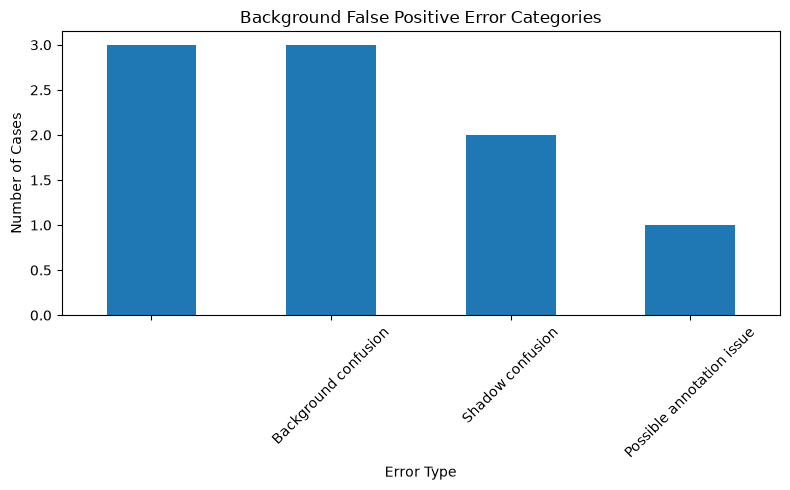

In [26]:
error_counts.plot(
    kind="bar",
    figsize=(8,5)
)

plt.xlabel("Error Type")
plt.ylabel("Number of Cases")
plt.title("Background False Positive Error Categories")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [27]:
background_fp[
    background_fp["error_type"] == ""
]

,image,pred_id,confidence,x1,y1,x2,y2,best_iou,status,error_type,note
1244,01197,0,0.834298,503.030823,226.027145,541.784851,245.270691,0.0,FP,,
1109,01079,1,0.785229,133.299622,433.576324,354.640198,485.178314,0.0,FP,,
1354,01296,1,0.749118,0.322311,471.282349,129.650909,720.000000,0.0,FP,,


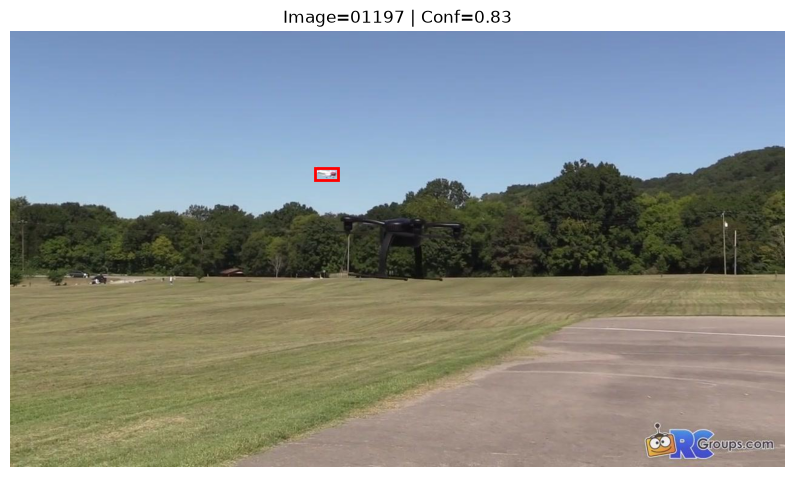

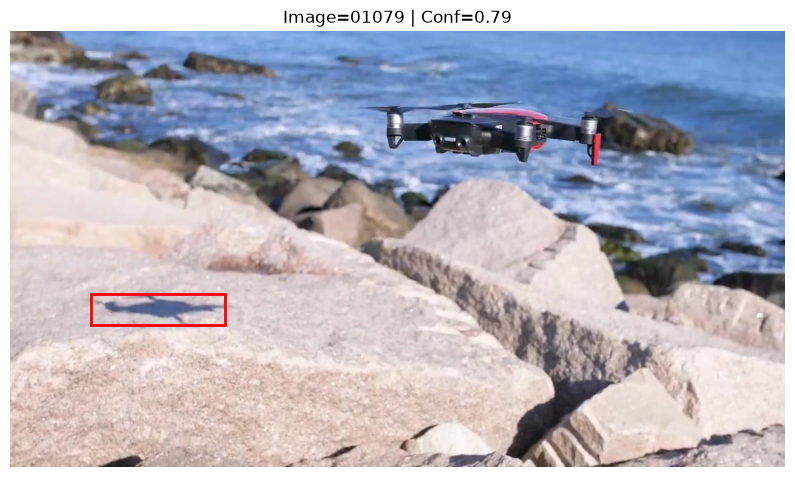

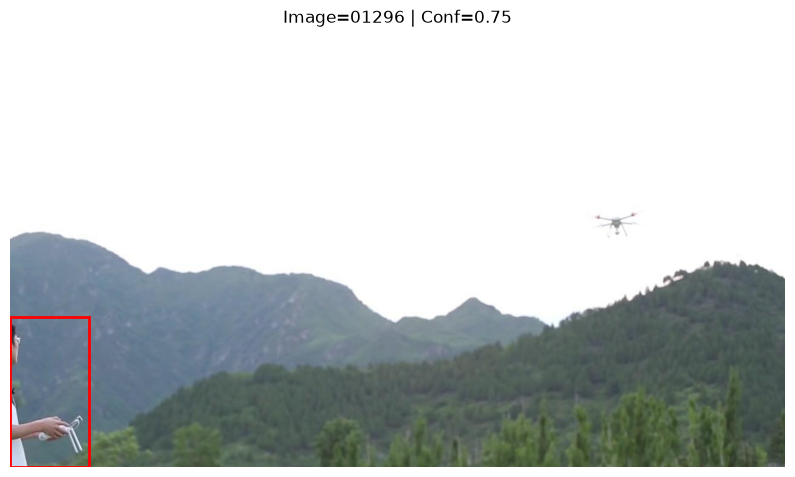

In [28]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2


remaining_fp = background_fp[
    background_fp["error_type"] == ""
]


for _, row in remaining_fp.iterrows():

    img_path = TEST_IMAGES / f"{row.image}.jpg"

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


    plt.figure(figsize=(10,7))
    plt.imshow(img)

    ax = plt.gca()


    rect = patches.Rectangle(
        (row.x1,row.y1),
        row.x2-row.x1,
        row.y2-row.y1,
        linewidth=2,
        edgecolor="red",
        facecolor="none"
    )

    ax.add_patch(rect)


    plt.title(
        f"Image={row.image} | "
        f"Conf={row.confidence:.2f}"
    )

    plt.axis("off")
    plt.show()

In [29]:
localization_fp[
    [
        "image",
        "confidence",
        "best_iou"
    ]
].head(20)

,image,confidence,best_iou
1234,01187,0.890132,0.470858
1302,01243,0.879506,0.456634
1273,01224,0.855506,0.463408
1267,01219,0.828034,0.389726
1277,01226,0.811765,0.318617
245,00227,0.797922,0.493233
1425,01363,0.796263,0.435641
1940,01871,0.784743,0.456644
1254,01206,0.777311,0.341529
1133,01092,0.772972,0.415575


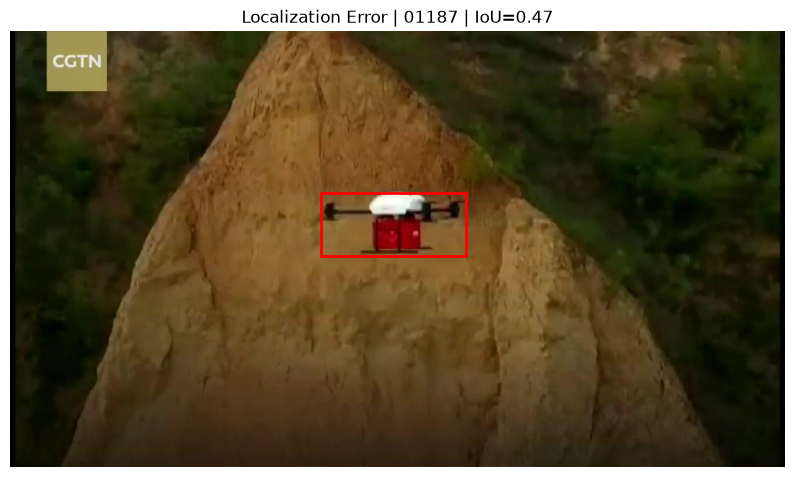

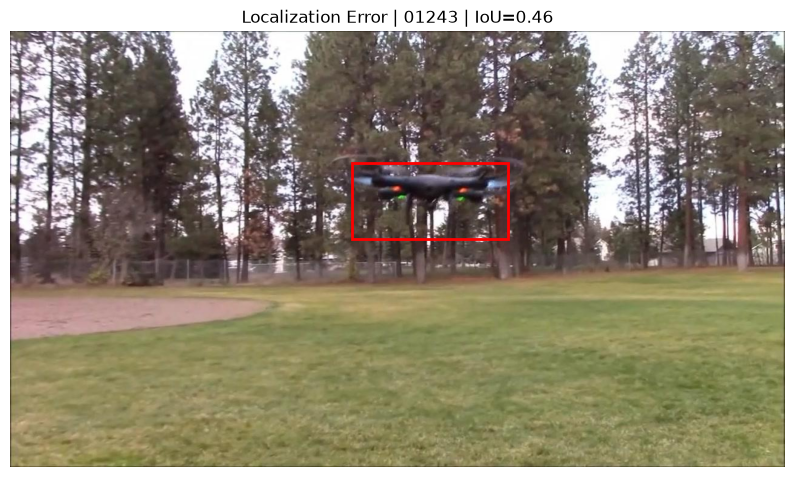

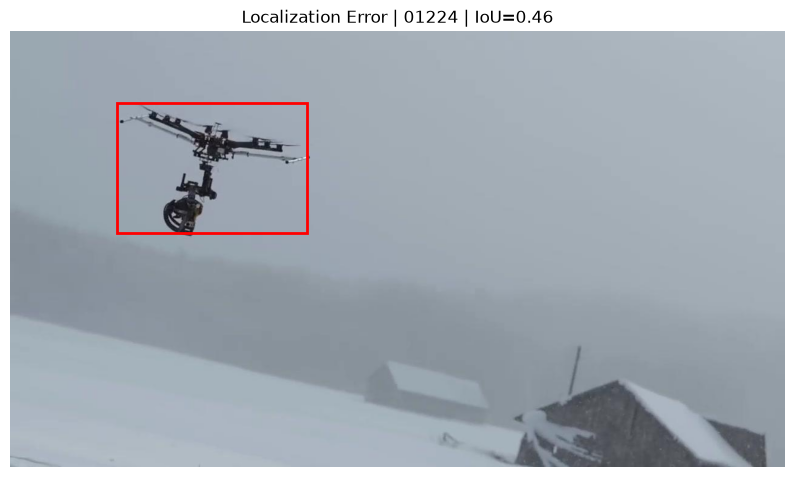

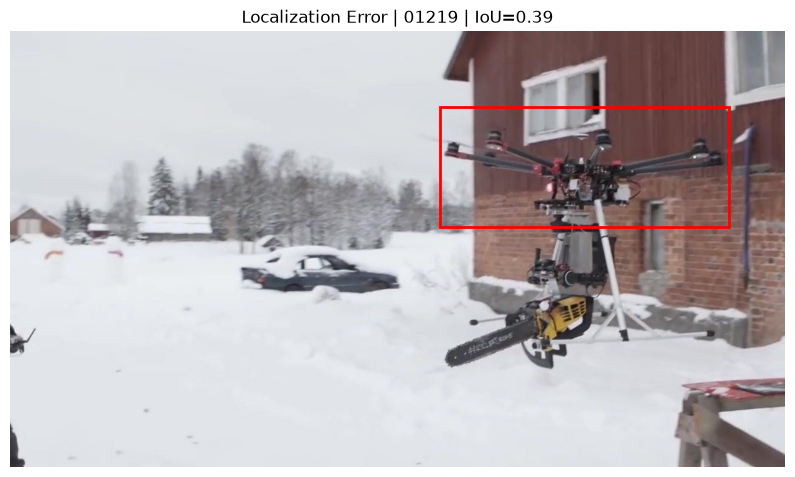

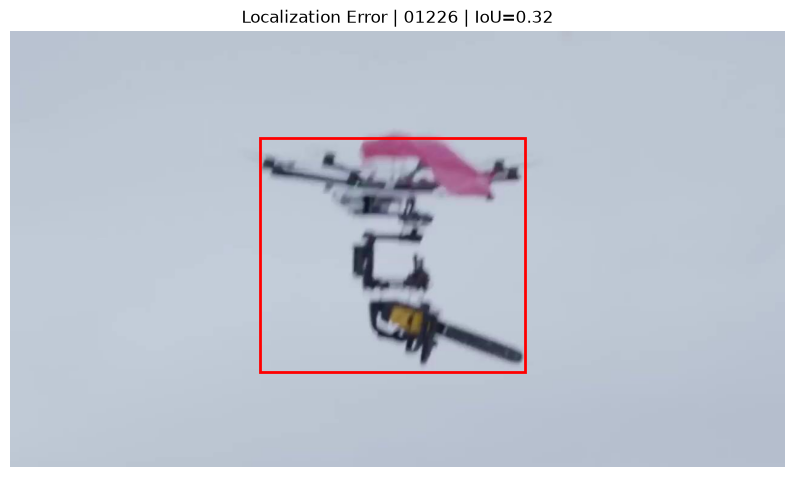

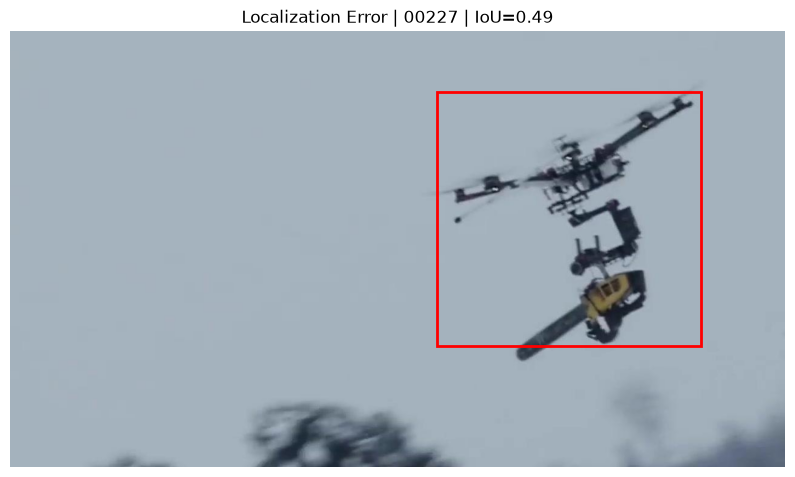

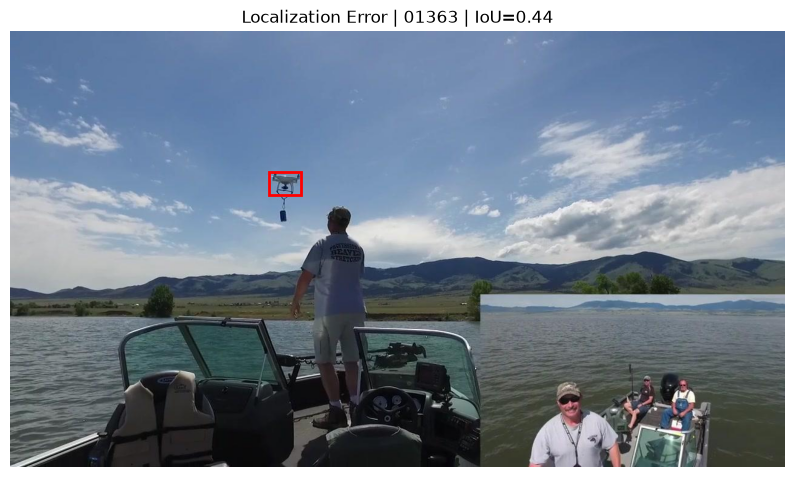

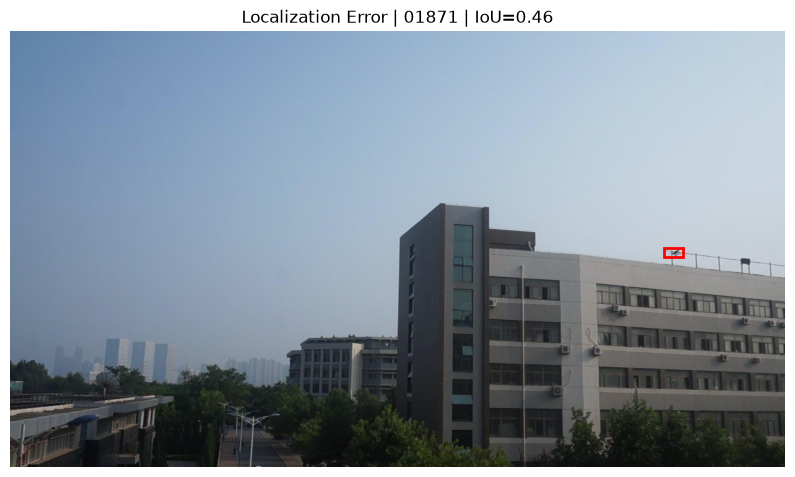

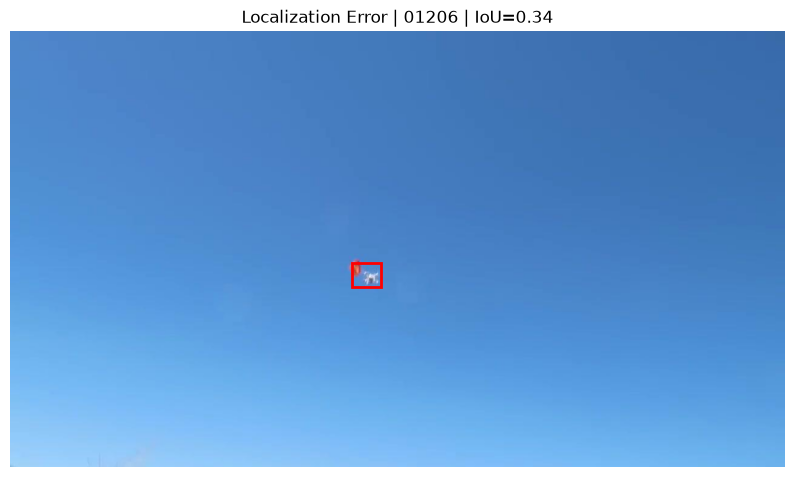

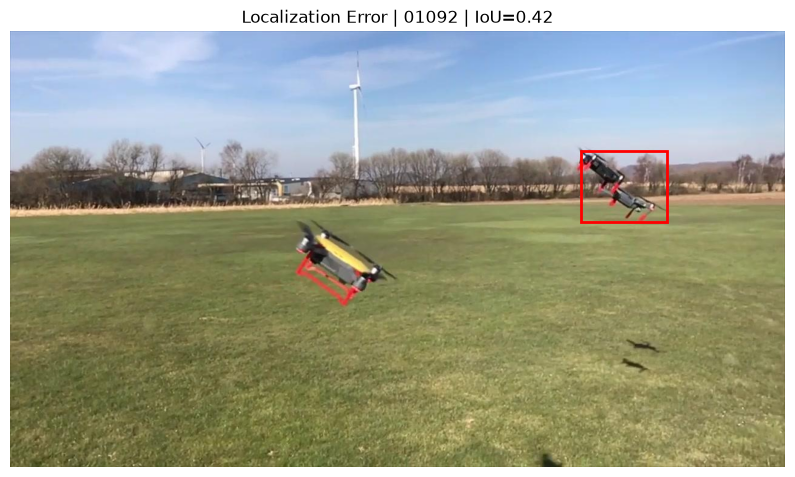

In [30]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2


for _, row in localization_fp.head(10).iterrows():

    img_path = TEST_IMAGES / f"{row.image}.jpg"

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10,7))
    plt.imshow(img)

    ax = plt.gca()


    # Prediction - Red
    ax.add_patch(
        patches.Rectangle(
            (row.x1,row.y1),
            row.x2-row.x1,
            row.y2-row.y1,
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )
    )


    plt.title(
        f"Localization Error | "
        f"{row.image} | IoU={row.best_iou:.2f}"
    )

    plt.axis("off")
    plt.show()

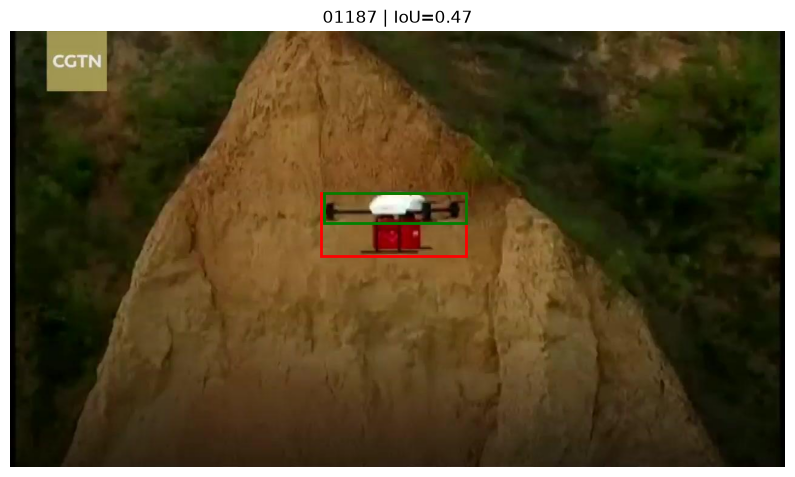

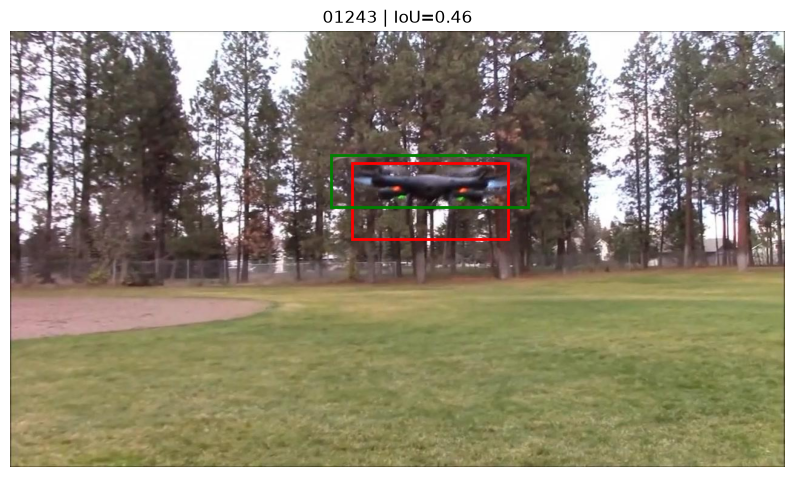

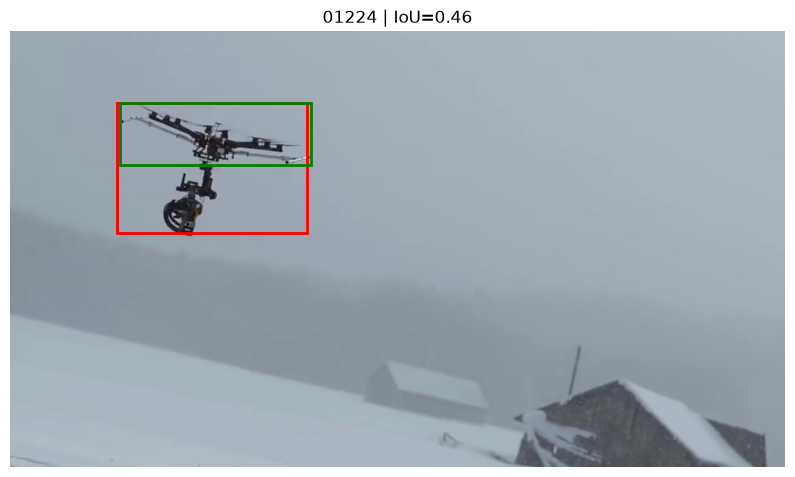

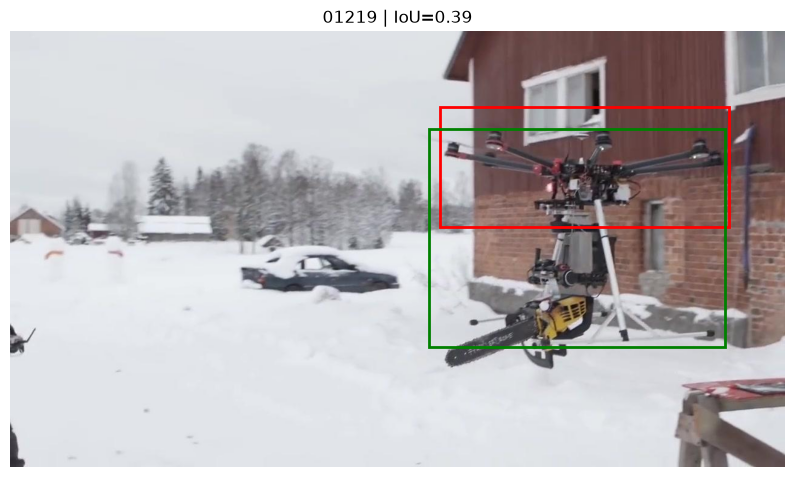

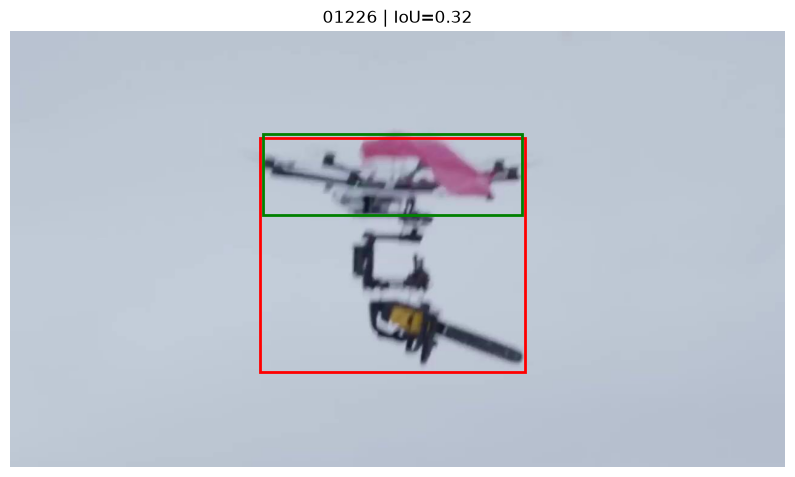

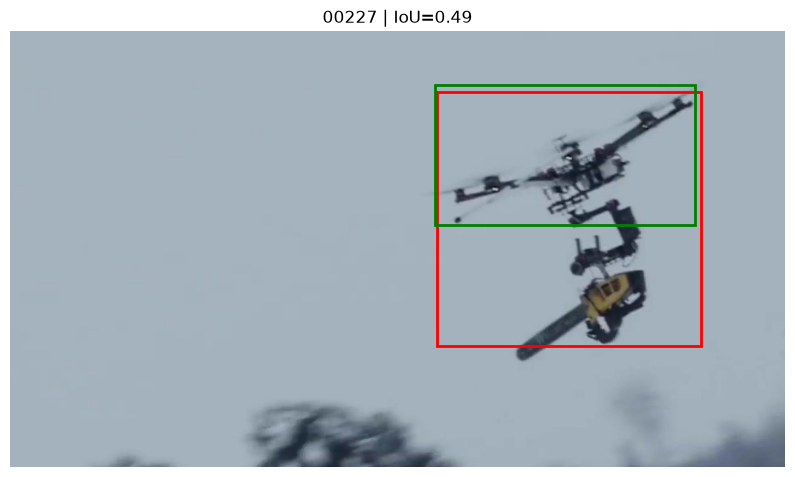

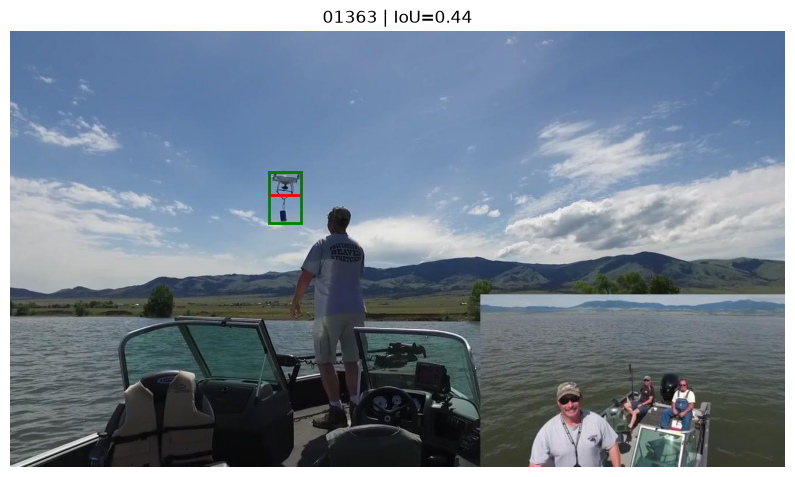

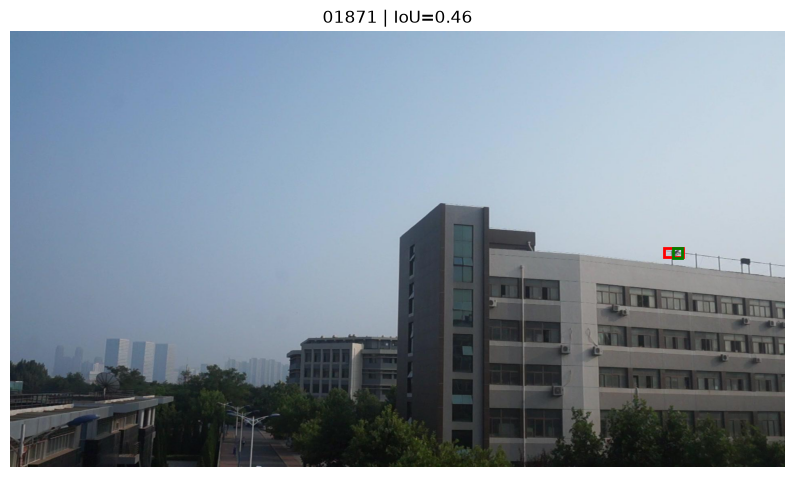

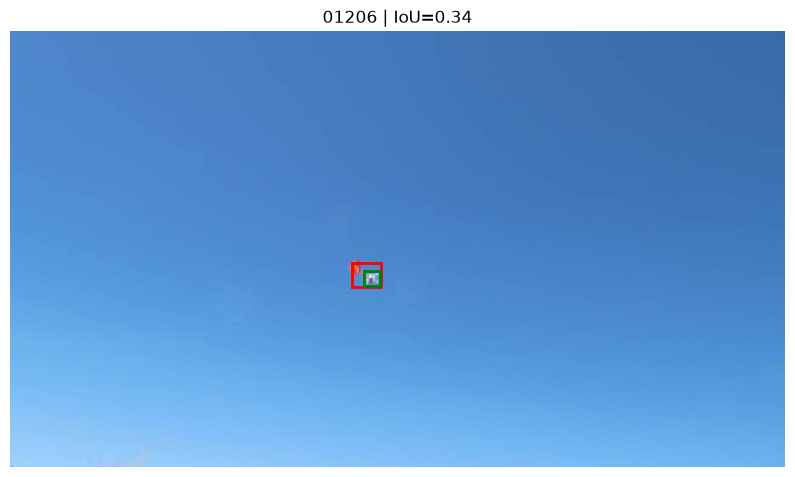

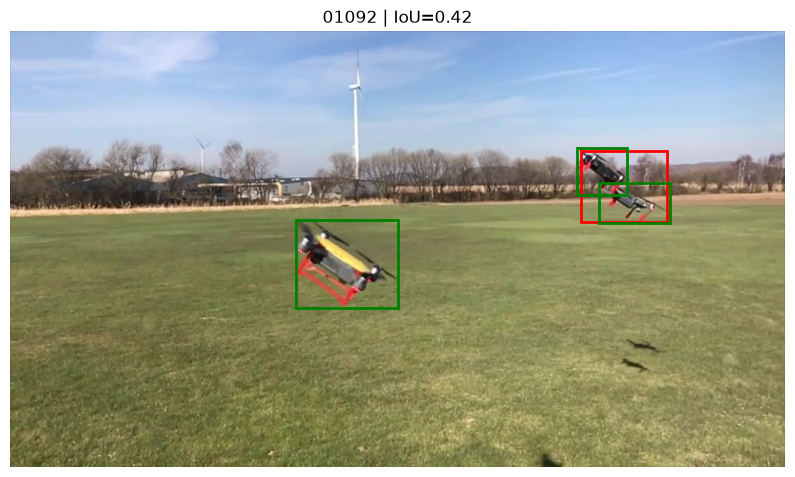

In [33]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2


for _, row in localization_fp.head(10).iterrows():

    img_path = TEST_IMAGES / f"{row.image}.jpg"

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h,w,_ = img.shape


    plt.figure(figsize=(10,7))
    plt.imshow(img)

    ax = plt.gca()


    # YOLO prediction (RED)
    ax.add_patch(
        patches.Rectangle(
            (row.x1,row.y1),
            row.x2-row.x1,
            row.y2-row.y1,
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )
    )


    # Ground truth (GREEN)

    label_path = TEST_LABELS / f"{row.image}.txt"

    if label_path.exists():

        with open(label_path) as f:

            for line in f:

                cls,xc,yc,bw,bh = map(float,line.split())


                xc *= w
                yc *= h
                bw *= w
                bh *= h


                gx1 = xc - bw/2
                gy1 = yc - bh/2


                ax.add_patch(
                    patches.Rectangle(
                        (gx1,gy1),
                        bw,
                        bh,
                        linewidth=2,
                        edgecolor="green",
                        facecolor="none"
                    )
                )


    plt.title(
        f"{row.image} | IoU={row.best_iou:.2f}"
    )

    plt.axis("off")
    plt.show()

In [34]:
localization_analysis = []

for _, row in localization_fp.iterrows():

    img_path = TEST_IMAGES / f"{row.image}.jpg"

    img = cv2.imread(str(img_path))
    h, w, _ = img.shape


    label_path = TEST_LABELS / f"{row.image}.txt"

    if label_path.exists():

        with open(label_path) as f:

            for line in f:

                cls, xc, yc, bw, bh = map(float, line.split())


                # YOLO -> pixels
                xc *= w
                yc *= h
                bw *= w
                bh *= h


                gt_x1 = xc - bw/2
                gt_y1 = yc - bh/2
                gt_x2 = xc + bw/2
                gt_y2 = yc + bh/2


                pred_w = row.x2 - row.x1
                pred_h = row.y2 - row.y1

                gt_w = gt_x2 - gt_x1
                gt_h = gt_y2 - gt_y1


                localization_analysis.append({

                    "image": row.image,

                    "pred_width": pred_w,
                    "gt_width": gt_w,

                    "pred_height": pred_h,
                    "gt_height": gt_h,

                    "width_ratio": pred_w / gt_w,
                    "height_ratio": pred_h / gt_h,

                    "iou": row.best_iou

                })

In [35]:
loc_df = pd.DataFrame(localization_analysis)

loc_df.head()

,image,pred_width,gt_width,pred_height,gt_height,width_ratio,height_ratio,iou
0,01187,239.679688,235.00032,103.783020,49.99968,1.019912,2.075674,0.470858
1,01243,258.100586,326.00064,125.215698,85.00032,0.791718,1.473120,0.456634
2,01224,314.659683,315.00032,213.888733,102.00024,0.998919,2.096943,0.463408
3,01219,476.127930,489.99936,198.611053,360.00000,0.971691,0.551697,0.389726
4,01226,437.885620,427.00032,387.610779,133.99992,1.025492,2.892619,0.318617


In [36]:
print("Average width ratio:", loc_df.width_ratio.mean())
print("Average height ratio:", loc_df.height_ratio.mean())

Average width ratio: 1.2481802732248282
Average height ratio: 1.5360992820370902
